In [2]:
#  Load Dataset
import pandas as pd
df = pd.read_csv("LightHR dataset.csv")
df.head()


,Gender,Age at time of application,Year of Application,A-levels scores,Education,University Name,Address,Current Employment,Current Employment Sector,Current Annual Income,References Submitted,Refree 1,Refree 2,Refree 3,Was Hired by a Company within 6 months
0,Female,40,2008,81,Law,SCHOOL OF ORIENTAL AND AFRICAN STUDIES,Lancashire,Salaried,Law,0,1,Self Business:Health,Salaried:Accounting,Contractual:Arts,1
1,Non-binary,48,2001,52,Arts,UNIVERSITY OF PORTSMOUTH,Pembrokeshire,Contractual,Arts,145882,0,NaN,NaN,NaN,0
2,Female,48,2005,77,STEM,UNIVERSITY OF STIRLING,Cambridgeshire,NaN,NaN,0,1,Contractual:Arts,Self Business:Arts,Self Business:Accounting,0
3,Non-binary,40,1999,46,STEM,UNIVERSITY OF KENT,Armagh,Self Business,IT,96719,1,Contractual:Law,Salaried:Engineering,Self Business:Accounting,0
4,Non-binary,41,2003,65,Law,UNIVERSITY OF SHEFFIELD,Wiltshire,Salaried,IT,74300,1,Salaried:IT,Salaried:Arts,Contractual:Engineering,0


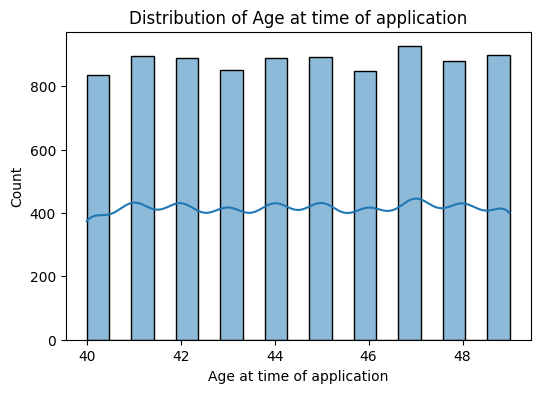

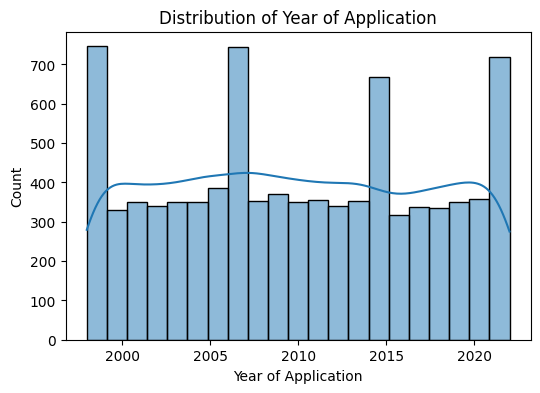

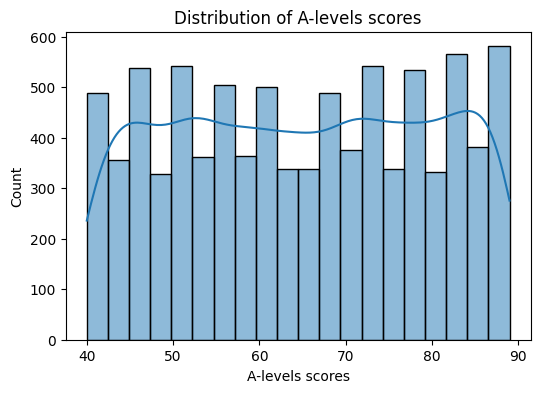

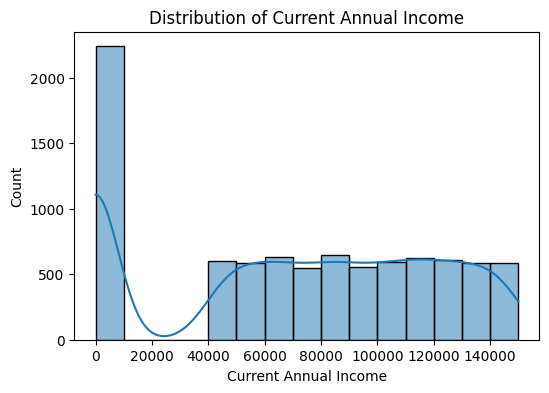

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualize distributions
continuous_cols = ['Age at time of application', 'Year of Application', 'A-levels scores', 'Current Annual Income']
for col in continuous_cols:
    plt.figure(figsize=(6, 4))
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()


In [3]:
df['Age_binned'] = pd.cut(df['Age at time of application'], bins=5, labels=False)


In [4]:
from sklearn.cluster import KMeans
import numpy as np

year_values = df['Year of Application'].values.reshape(-1, 1)
kmeans = KMeans(n_clusters=5, random_state=42).fit(year_values)
df['Year_binned'] = kmeans.labels_


In [5]:
df['Alevels_binned'] = pd.cut(df['A-levels scores'], bins=5, labels=False)


In [6]:
# Replace zeros with small value to apply log safely
df['Income_nonzero'] = df['Current Annual Income'].replace(0, 1)
income_log = np.log(df['Income_nonzero']).values.reshape(-1, 1)

kmeans_income = KMeans(n_clusters=5, random_state=42).fit(income_log)
df['Income_binned'] = kmeans_income.labels_


In [7]:
df[['Age_binned', 'Year_binned', 'Alevels_binned', 'Income_binned']].head()


,Age_binned,Year_binned,Alevels_binned,Income_binned
0,0,0,4,1
1,4,3,1,2
2,4,0,3,1
3,0,3,0,0
4,0,0,2,4


In [9]:
print(df.columns)


Index(['Gender', 'Age at time of application', 'Year of Application',
       'A-levels scores', 'Education', 'University Name', 'Address',
       'Current Employment', 'Current Employment Sector',
       'Current Annual Income', 'References Submitted', 'Refree 1', 'Refree 2',
       'Refree 3', 'Was Hired by a Company within 6 months', 'Age_binned',
       'Year_binned', 'Alevels_binned', 'Income_nonzero', 'Income_binned'],
      dtype='object')


In [8]:
df['Referee_diversity'] = (
    (df['Refree 1'] != df['Refree 2']) |
    (df['Refree 2'] != df['Refree 3']) |
    (df['Refree 1'] != df['Refree 3'])
).astype(int)


In [9]:
def has_sector_alignment(row):
    applicant_sector = row['Current Employment Sector']
    referees = [row['Refree 1'], row['Refree 2'], row['Refree 3']]
    return int(applicant_sector in referees)

df['Ref_sector_alignment'] = df.apply(has_sector_alignment, axis=1)


In [10]:
df['Num_valid_referees'] = df[['Refree 1', 'Refree 2', 'Refree 3']].apply(
    lambda x: sum(val != 'None' for val in x), axis=1
)


In [11]:
referee_cols = ['Refree 1', 'Refree 2', 'Refree 3']
df.drop(columns=referee_cols, inplace=True)


In [12]:
df.head()


,Gender,Age at time of application,Year of Application,A-levels scores,Education,University Name,Address,Current Employment,Current Employment Sector,Current Annual Income,References Submitted,Was Hired by a Company within 6 months,Age_binned,Year_binned,Alevels_binned,Income_nonzero,Income_binned,Referee_diversity,Ref_sector_alignment,Num_valid_referees
0,Female,40,2008,81,Law,SCHOOL OF ORIENTAL AND AFRICAN STUDIES,Lancashire,Salaried,Law,0,1,1,0,0,4,1,1,1,0,3
1,Non-binary,48,2001,52,Arts,UNIVERSITY OF PORTSMOUTH,Pembrokeshire,Contractual,Arts,145882,0,0,4,3,1,145882,2,1,0,3
2,Female,48,2005,77,STEM,UNIVERSITY OF STIRLING,Cambridgeshire,NaN,NaN,0,1,0,4,0,3,1,1,1,0,3
3,Non-binary,40,1999,46,STEM,UNIVERSITY OF KENT,Armagh,Self Business,IT,96719,1,0,0,3,0,96719,0,1,0,3
4,Non-binary,41,2003,65,Law,UNIVERSITY OF SHEFFIELD,Wiltshire,Salaried,IT,74300,1,0,0,0,2,74300,4,1,0,3


In [13]:
df[['Referee_diversity', 'Num_valid_referees', 'Ref_sector_alignment']].head()


,Referee_diversity,Num_valid_referees,Ref_sector_alignment
0,1,3,0
1,1,3,0
2,1,3,0
3,1,3,0
4,1,3,0


In [32]:
cols_for_ar = [
    'Gender',
    'Education',
    'University Name',
    'Address',
    'Current Employment',
    'Current Employment Sector',
    'Age_binned',
    'Year_binned',
    'Alevels_binned',
    'Income_binned',
    'Was Hired by a Company within 6 months'
]


transactions = df[cols_for_ar].astype(str).apply(lambda row: [f"{col}={val}" for col, val in row.items()], axis=1).tolist()

# Encode for association rule mining
from mlxtend.preprocessing import TransactionEncoder
te = TransactionEncoder()
te_ary = te.fit(transactions).transform(transactions)
df_trans = pd.DataFrame(te_ary, columns=te.columns_)



In [33]:
print(df_trans.columns.tolist())



['Address=Aberdeen City', 'Address=Aberdeenshire', 'Address=Anglesey', 'Address=Angus', 'Address=Antrim', 'Address=Argyll and Bute', 'Address=Armagh', 'Address=Bedfordshire', 'Address=Berkshire', 'Address=Breconshire', 'Address=Buckinghamshire', 'Address=Caernarvonshire', 'Address=Cambridgeshire', 'Address=Cardiganshire', 'Address=Carmarthenshire', 'Address=Cheshire', 'Address=City of Edinburgh', 'Address=Clackmannanshire', 'Address=Cleveland', 'Address=Cornwall', 'Address=Cumbria', 'Address=Denbighshire', 'Address=Derbyshire', 'Address=Derry and Londonderry', 'Address=Devon', 'Address=Dorset', 'Address=Down', 'Address=Dumfries and Galloway', 'Address=Dundee City', 'Address=Durham', 'Address=East Ayrshire', 'Address=East Dunbartonshire', 'Address=East Lothian', 'Address=East Renfrewshire', 'Address=East Sussex', 'Address=Eilean Siar', 'Address=Essex', 'Address=Falkirk', 'Address=Fermanagh', 'Address=Fife', 'Address=Flintshire', 'Address=Glamorgan', 'Address=Glasgow City', 'Address=Glou

In [34]:
from mlxtend.frequent_patterns import apriori, association_rules


frequent_itemsets = apriori(df_trans, min_support=0.05, use_colnames=True)
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.6)



# Filter for rules with hiring as the consequence
rules_hiring = rules[
    rules['consequents'].apply(lambda x: 'Was Hired by a Company within 6 months=1' in x)
]


# Shows top rules
rules_hiring[['antecedents', 'consequents', 'support', 'confidence', 'lift']].sort_values(by='confidence', ascending=False).head(10)



,antecedents,consequents,support,confidence,lift
97,"(Alevels_binned=4, Current Employment=Salaried)",(Was Hired by a Company within 6 months=1),0.068523,0.972581,4.056261
103,"(Alevels_binned=4, Gender=Male)",(Was Hired by a Company within 6 months=1),0.051591,0.957806,3.994641
95,"(Alevels_binned=4, Current Employment=Contract...",(Was Hired by a Company within 6 months=1),0.065341,0.951987,3.970371
99,"(Alevels_binned=4, Current Employment=Self Bus...",(Was Hired by a Company within 6 months=1),0.064432,0.949749,3.961037
107,"(Alevels_binned=4, Income_binned=2)",(Was Hired by a Company within 6 months=1),0.062045,0.949565,3.960272
101,"(Alevels_binned=4, Education=Business)",(Was Hired by a Company within 6 months=1),0.054205,0.942688,3.931589
9,(Alevels_binned=4),(Was Hired by a Company within 6 months=1),0.198295,0.938172,3.912755
109,"(Alevels_binned=4, Year_binned=0)",(Was Hired by a Company within 6 months=1),0.059545,0.937388,3.909486
105,"(Alevels_binned=4, Gender=Non-binary)",(Was Hired by a Company within 6 months=1),0.050000,0.926316,3.863308


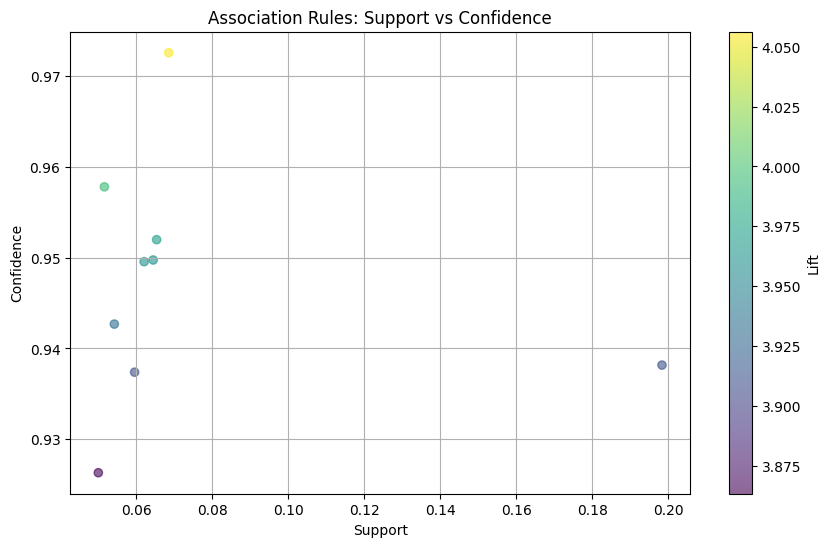

In [35]:
# Plot: Support vs Confidence
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(rules_hiring['support'], rules_hiring['confidence'], alpha=0.6, c=rules_hiring['lift'], cmap='viridis')
plt.title('Association Rules: Support vs Confidence')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.colorbar(label='Lift')
plt.grid(True)
plt.show()


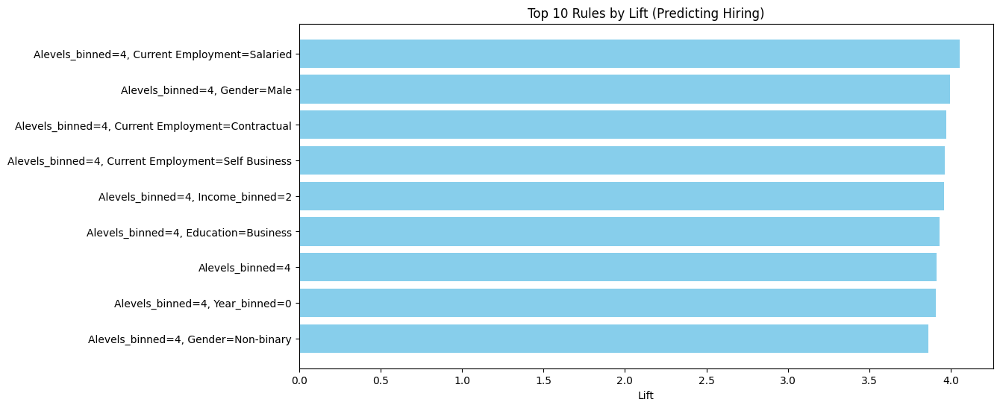

In [36]:
#Plot: Top 10 Rules by Lift (Bar Chart)
top_rules = rules_hiring.sort_values(by='lift', ascending=False).head(10)

plt.figure(figsize=(12, 6))
plt.barh(
    [', '.join(list(x)) for x in top_rules['antecedents']],
    top_rules['lift'],
    color='skyblue'
)
plt.xlabel('Lift')
plt.title('Top 10 Rules by Lift (Predicting Hiring)')
plt.gca().invert_yaxis()
plt.show()


In [37]:
# Preparing Features for Clustering
from sklearn.preprocessing import StandardScaler

# Features for clustering
clustering_features = [
    'Age_binned', 'Year_binned', 'Alevels_binned', 'Income_binned',
    'Ref_sector_alignment', 'Referee_diversity'
]

# Drop rows with missing values for clustering
df_cluster = df[clustering_features].dropna()

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cluster)



In [38]:
# Run K-Medoids
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import calculate_distance_matrix
import numpy as np

# Choose 3 initial medoids (by index)
initial_medoids = [0, 100, 200]


distance_matrix = calculate_distance_matrix(X_scaled.tolist())

# Create and run K-Medoids 
kmedoids_instance = kmedoids(data=distance_matrix, initial_index_medoids=initial_medoids, data_type='distance_matrix')
kmedoids_instance.process()

# Get cluster assignments
clusters = kmedoids_instance.get_clusters()

# Create a cluster label column for each row
cluster_labels = np.full(len(df), -1)
for i, cluster in enumerate(clusters):
    cluster_labels[df_cluster.index[cluster]] = i

df['Cluster'] = cluster_labels


In [39]:
# Checks how many points are in each cluster
print(df['Cluster'].value_counts())

# Picking the largest cluster
largest_cluster_id = df['Cluster'].value_counts().idxmax()

# Filtering the DataFrame to only include the largest cluster
df_largest_cluster = df[df['Cluster'] == largest_cluster_id]

second_cluster_id = df['Cluster'].value_counts().index[1]
df_second_cluster = df[df['Cluster'] == second_cluster_id]



Cluster
2    3989
0    3667
1    1144
Name: count, dtype: int64


In [40]:
#Redoing association rule mining on the largest cluster
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules

# Columns for rule mining 
cols_for_ar_cluster = [
    'Gender',
    'Education',
    'University Name',
    'Address',
    'Current Employment',
    'Current Employment Sector',
    'Age_binned',
    'Year_binned',
    'Alevels_binned',
    'Income_binned',
    'Was Hired by a Company within 6 months'
]


transactions_cluster = df_largest_cluster[cols_for_ar_cluster].astype(str).apply(
    lambda row: [f"{col}={val}" for col, val in row.items()], axis=1
).tolist()


te = TransactionEncoder()
te_ary_cluster = te.fit_transform(transactions_cluster)
df_trans_cluster = pd.DataFrame(te_ary_cluster, columns=te.columns_)

# Applying Apriori algorithm
frequent_itemsets_cluster = apriori(df_trans_cluster, min_support=0.05, use_colnames=True)
rules_cluster = association_rules(frequent_itemsets_cluster, metric='confidence', min_threshold=0.6)

# Focus only on rules where the consequence is hiring
rules_cluster_hiring = rules_cluster[
    rules_cluster['consequents'].apply(lambda x: 'Was Hired by a Company within 6 months=0' in x)
]

# Shows top 10 rules
rules_cluster_hiring[['antecedents', 'consequents', 'support', 'confidence', 'lift']].sort_values(
    by='confidence', ascending=False).head(10)


,antecedents,consequents,support,confidence,lift
366,"(Income_binned=1, Alevels_binned=1)","(Current Employment=nan, Was Hired by a Compan...",0.055653,1.0,6.550082
361,"(Current Employment=nan, Income_binned=1, Alev...","(Was Hired by a Company within 6 months=0, Cur...",0.055653,1.0,6.550082
332,"(Current Employment=nan, Income_binned=1)","(Was Hired by a Company within 6 months=0, Cur...",0.109802,1.0,6.550082
329,"(Current Employment=nan, Income_binned=1, Curr...",(Was Hired by a Company within 6 months=0),0.109802,1.0,1.012180
323,"(Current Employment=nan, Income_binned=1, Alev...",(Was Hired by a Company within 6 months=0),0.055653,1.0,1.012180
327,"(Income_binned=1, Alevels_binned=1)","(Current Employment=nan, Was Hired by a Compan...",0.055653,1.0,6.550082
321,"(Income_binned=1, Alevels_binned=1)","(Was Hired by a Company within 6 months=0, Cur...",0.055653,1.0,6.550082
319,"(Income_binned=1, Alevels_binned=1, Current Em...",(Was Hired by a Company within 6 months=0),0.055653,1.0,1.012180
37,(Income_binned=2),(Was Hired by a Company within 6 months=0),0.358486,1.0,1.012180
317,"(Alevels_binned=1, Current Employment Sector=nan)","(Current Employment=nan, Was Hired by a Compan...",0.069942,1.0,6.550082


In [41]:
for c in rules_cluster['consequents'].unique():
    print(c)


frozenset({'Was Hired by a Company within 6 months=0'})
frozenset({'Income_binned=4'})
frozenset({'Current Employment Sector=nan'})
frozenset({'Current Employment=nan'})
frozenset({'Income_binned=1'})
frozenset({'Income_binned=1', 'Current Employment Sector=nan'})
frozenset({'Current Employment=nan', 'Current Employment Sector=nan'})
frozenset({'Current Employment=nan', 'Income_binned=1'})
frozenset({'Was Hired by a Company within 6 months=0', 'Current Employment Sector=nan'})
frozenset({'Current Employment=nan', 'Was Hired by a Company within 6 months=0'})
frozenset({'Income_binned=1', 'Was Hired by a Company within 6 months=0'})
frozenset({'Income_binned=1', 'Was Hired by a Company within 6 months=0', 'Current Employment Sector=nan'})
frozenset({'Current Employment=nan', 'Was Hired by a Company within 6 months=0', 'Current Employment Sector=nan'})
frozenset({'Current Employment=nan', 'Income_binned=1', 'Was Hired by a Company within 6 months=0'})


In [42]:
df_largest_cluster['Was Hired by a Company within 6 months'].value_counts()


Was Hired by a Company within 6 months
0    3941
1      48
Name: count, dtype: int64

In [14]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer


df_model = df.copy()

# Target
target_col = 'Was Hired by a Company within 6 months'

# Encode target if not already binary
if df_model[target_col].dtype == 'object':
    df_model[target_col] = LabelEncoder().fit_transform(df_model[target_col])

# Drop rows with missing target
df_model = df_model.dropna(subset=[target_col])

# Separate features and target
X = df_model.drop(columns=[target_col])
y = df_model[target_col]

# Handle missing values (SimpleImputer)
imputer = SimpleImputer(strategy='most_frequent')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

# Encode categorical variables
X_encoded = pd.get_dummies(X_imputed)

# Split into train/test sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42, stratify=y)


In [15]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

dt_params = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'criterion': ['gini', 'entropy']
}

dt = DecisionTreeClassifier(random_state=42)
dt_grid = GridSearchCV(dt, dt_params, cv=5, scoring='accuracy', n_jobs=-1)
dt_grid.fit(X_train, y_train)

print("Best Decision Tree Accuracy:", dt_grid.best_score_)
print("Best Parameters:", dt_grid.best_params_)


Best Decision Tree Accuracy: 0.9748579545454547
Best Parameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_split': 5}


In [45]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier

rf_params = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5]
}

rf = RandomForestClassifier(random_state=42)
rf_grid = GridSearchCV(rf, rf_params, cv=5, scoring='accuracy', n_jobs=-1)
rf_grid.fit(X_train, y_train)

print("Best Random Forest Accuracy:", rf_grid.best_score_)
print("Best Parameters:", rf_grid.best_params_)


Best Random Forest Accuracy: 0.9732954545454546
Best Parameters: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 200}


In [46]:
# Bagging with decision tree
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

bagging_params = {
    'n_estimators': [10, 50, 100],
    'max_samples': [0.5, 1.0]
}


bag_dt = BaggingClassifier(estimator=DecisionTreeClassifier(), random_state=42)
bag_grid = GridSearchCV(bag_dt, bagging_params, cv=5, scoring='accuracy', n_jobs=-1)
bag_grid.fit(X_train, y_train)

print("Best Bagging Accuracy:", bag_grid.best_score_)
print("Best Parameters:", bag_grid.best_params_)


Best Bagging Accuracy: 0.9786931818181819
Best Parameters: {'max_samples': 1.0, 'n_estimators': 10}


In [16]:
# Ada Boost
from sklearn.ensemble import AdaBoostClassifier

ada_params = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.5, 1.0, 1.5]
}

ada = AdaBoostClassifier(random_state=42)
ada_grid = GridSearchCV(ada, ada_params, cv=5, scoring='accuracy', n_jobs=-1)
ada_grid.fit(X_train, y_train)

print("Best AdaBoost Accuracy:", ada_grid.best_score_)
print("Best Parameters:", ada_grid.best_params_)


Best AdaBoost Accuracy: 0.9816761363636364
Best Parameters: {'learning_rate': 1.5, 'n_estimators': 100}


In [17]:
!pip install xgboost


In [16]:
# XGBoost
from xgboost import XGBClassifier

xgb_params = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.05, 0.1, 0.2]
}

xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
xgb_grid = GridSearchCV(xgb, xgb_params, cv=5, scoring='accuracy', n_jobs=-1)
xgb_grid.fit(X_train, y_train)

print("Best XGBoost Accuracy:", xgb_grid.best_score_)
print("Best Parameters:", xgb_grid.best_params_)


C:\Users\sreek\AppData\Local\Programs\Python\Python312\Lib\site-packages\xgboost\training.py:183: UserWarning: [13:51:52] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Best XGBoost Accuracy: 0.9830965909090909
Best Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100}


In [17]:
# Evaluate on train and test
from sklearn.metrics import accuracy_score
best_xgb = xgb_grid.best_estimator_
train_acc = accuracy_score(y_train, best_xgb.predict(X_train))
test_acc = accuracy_score(y_test, best_xgb.predict(X_test))

print("Training Accuracy:", train_acc)
print("Test Accuracy:", test_acc)


Training Accuracy: 0.9872159090909091
Test Accuracy: 0.9880681818181818


In [21]:
!pip install shap


   ---------------------------------------- 0.0/545.2 kB ? eta -:--:--
   ---------------------------------------- 545.2/545.2 kB 6.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.8 MB ? eta -:--:--
   ---------------------------------------- 2.8/2.8 MB 18.4 MB/s eta 0:00:00
   ---------------------------------------- 0.0/30.3 MB ? eta -:--:--
   ------ --------------------------------- 4.7/30.3 MB 23.8 MB/s eta 0:00:02
   -------------------- ------------------- 15.7/30.3 MB 38.1 MB/s eta 0:00:01
   ---------------------------------- ----- 26.0/30.3 MB 42.2 MB/s eta 0:00:01
   ---------------------------------------- 30.3/30.3 MB 37.8 MB/s eta 0:00:00


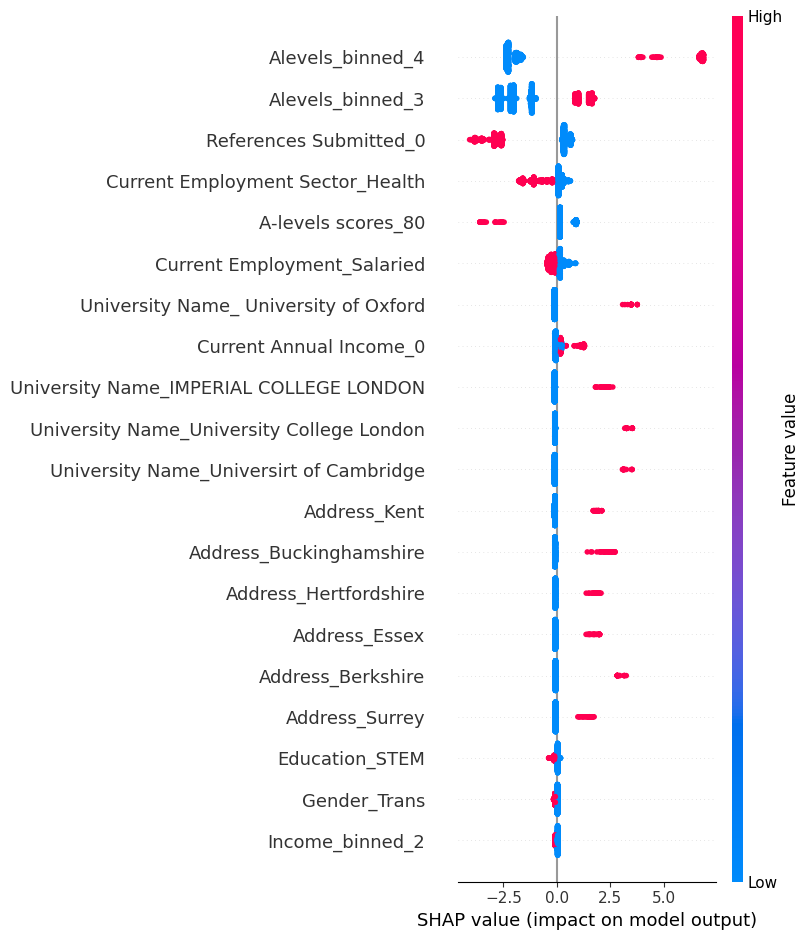

Top features: ['Alevels_binned_4' 'Alevels_binned_3' 'References Submitted_0'
 'Current Employment Sector_Health' 'A-levels scores_80']


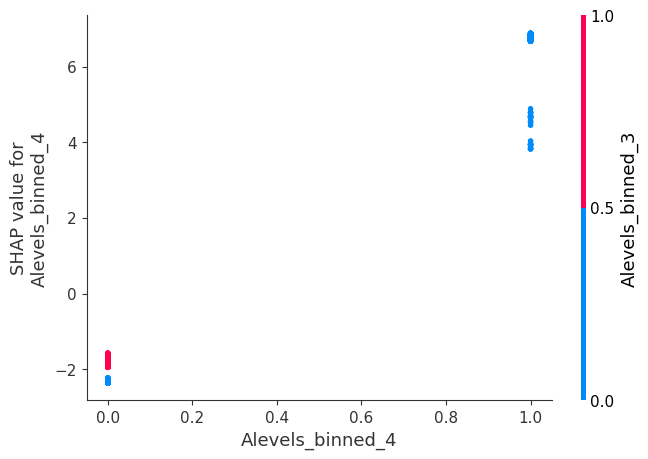

In [25]:
import shap

# Create TreeExplainer for XGBoost
explainer = shap.TreeExplainer(best_xgb)
shap_values = explainer.shap_values(X_test)

# Global Summary Plot
shap.summary_plot(shap_values, X_test)

feature_importance = np.abs(shap_values).mean(axis=0)
top_features = np.array(X_test.columns)[np.argsort(feature_importance)[::-1]]

print("Top features:", top_features[:5])


shap.dependence_plot(top_features[0], shap_values, X_test)



In [27]:
!pip install lime

  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
   ---------------------------------------- 0.0/12.9 MB ? eta -:--:--
   ----------------- ---------------------- 5.5/12.9 MB 28.0 MB/s eta 0:00:01
   ---------------------------------------- 12.9/12.9 MB 32.3 MB/s eta 0:00:00
   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
   ---------------------------------------- 1.7/1.7 MB 15.5 MB/s eta 0:00:00
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283840 sha256=e9f3986843b5ca6e7dce02ab662a388a59f4afd90f3096ea27cffdaa9c6520be
  Stored in directory: c:\users\sreek\appdata\local\pip\cache\wheels\e7\5d\0e\4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [30]:
import lime.lime_tabular
import numpy as np


X_train_lime = X_train.copy()
X_test_lime = X_test.copy()

for col in X_train_lime.select_dtypes(include=['bool']).columns:
    X_train_lime[col] = X_train_lime[col].astype(int)
    X_test_lime[col] = X_test_lime[col].astype(int)

# Create LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_lime),
    feature_names=X_train_lime.columns,
    class_names=['Not Hired', 'Hired'],
    mode='classification'
)

# Randomly sample 5-8 test instances
np.random.seed(42)
sample_indices = np.random.choice(X_test_lime.index, size=6, replace=False)

# Run explanation on each
for idx in sample_indices:
    exp = explainer.explain_instance(
        X_test_lime.loc[idx].values,
        best_xgb.predict_proba,
        num_features=5
    )
    exp.show_in_notebook(show_table=True)



In [13]:
!pip install fairlearn



[notice] A new release of pip is available: 25.0.1 -> 25.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [19]:

from fairlearn.metrics import MetricFrame, equalized_odds_difference, true_positive_rate
from sklearn.metrics import accuracy_score
from sklearn.neighbors import NearestNeighbors

import numpy as np
import pandas as pd

# ----
#  1. Group Fairness Evaluation 
# ----

# Predict on Test Set
y_pred = best_xgb.predict(X_test)

# Define protected attributes
protected_attributes = {
    'Gender': {
        'privileged': ['Male'],
        'unprivileged': ['Female', 'Trans', 'Non-binary']
    },
    'Age_binned': {
        'privileged': [2, 3],
        'unprivileged': [0, 1, 4]
    },
    'Address': {
        'privileged': ['Greater London', 'Greater Manchester'],
        'unprivileged': ['Others']
    },
    'University Name': {
        'privileged': ['University of Oxford', 'University of Cambridge', 'IMPERIAL COLLEGE LONDON'],
        'unprivileged': ['Others']
    }
}

# Compute selection rate ( disparate impact)
def selection_rate(y_pred, sensitive_features):
    return pd.Series(y_pred)[sensitive_features].mean()

# Compute true positive rate for equal opportunity
def true_positive_rate_diff(y_true, y_pred, sensitive_features):
    tpr_priv = ((y_pred == 1) & (y_true == 1) & sensitive_features).sum() / ((y_true == 1) & sensitive_features).sum()
    tpr_unpriv = ((y_pred == 1) & (y_true == 1) & ~sensitive_features).sum() / ((y_true == 1) & ~sensitive_features).sum()
    return tpr_priv - tpr_unpriv

# Helper function to compute metrics
def compute_group_fairness(X_test, y_true, y_pred, feature_name, priv, unpriv):
    groups = X_test[feature_name].copy()

   
    if feature_name in ['Address', 'University Name']:
        groups = groups.apply(lambda x: x if x in priv else 'Others')

    group_membership = groups.isin(priv)

    
    y_pred_series = pd.Series(y_pred, index=X_test.index)

    # Disparate Impact: SR_unpriv / SR_priv
    sr_priv = y_pred_series[group_membership].mean()
    sr_unpriv = y_pred_series[~group_membership].mean()
    di = sr_unpriv / sr_priv if sr_priv > 0 else np.nan

    # Equalized Odds and Equal Opportunity
    eod = equalized_odds_difference(y_true, y_pred, sensitive_features=group_membership)
    
    # Equal Opportunity (TPR diff only)
    true_positive_rate = lambda y_true, y_pred: ((y_pred == 1) & (y_true == 1)).sum() / (y_true == 1).sum()
    tpr_priv = true_positive_rate(y_true[group_membership], y_pred_series[group_membership])
    tpr_unpriv = true_positive_rate(y_true[~group_membership], y_pred_series[~group_membership])
    eop = abs(tpr_unpriv - tpr_priv)

    return di, eod, eop

# Adding protected attributes to test set
protected_cols = ['Gender', 'Age_binned', 'Address', 'University Name']
X_test_attrs = df_model.loc[X_test.index, protected_cols].copy()
X_test_combined = X_test.copy()
X_test_combined[protected_cols] = X_test_attrs.values

# Run fairness metrics
results = {}
for attr, groups in protected_attributes.items():
    di, eod, eop = compute_group_fairness(X_test_combined, y_test, y_pred, attr, groups['privileged'], groups['unprivileged'])
    results[attr] = {
        'Disparate Impact Ratio': di,
        'Equalized Odds Difference': eod,
        'Equal Opportunity Difference': eop
    }

# Display
fairness_df = pd.DataFrame(results).T
print("=== Group Fairness Metrics ===")
display(fairness_df)


# ----
#  2. Individual Fairness Evaluation
# ----

# Non-protected columns
non_protected_cols = [col for col in X_test_combined.columns if not any(p in col for p in ['Gender', 'Age', 'University', 'Address'])]
X_test_nonprotected = X_test_combined[non_protected_cols]

# Fit KNN
knn = NearestNeighbors(n_neighbors=5)
knn.fit(X_test_nonprotected)
distances, neighbors = knn.kneighbors(X_test_nonprotected)

# Consistency calculation
consistencies = []
for i, neighbor_idxs in enumerate(neighbors):
    neighbor_preds = y_pred[neighbor_idxs]
    majority_vote = np.round(np.mean(neighbor_preds))
    consistencies.append(majority_vote == y_pred[i])

individual_consistency_score = np.mean(consistencies)
print(f"\n=== Individual Fairness Score (Consistency): {individual_consistency_score:.4f} ===")



=== Group Fairness Metrics ===


,Disparate Impact Ratio,Equalized Odds Difference,Equal Opportunity Difference
Gender,0.759135,0.014862,0.014862
Age_binned,0.839158,0.010252,0.010252
Address,0.789993,0.083937,0.083937
University Name,0.270312,0.109606,0.046154



=== Individual Fairness Score (Consistency): 0.9670 ===
